In this notebook, we will analyze the different baseline comparisons obtained in the other notebooks.

In [ ]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..','..','..')))
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import numpy as np
from Code.benchmark import Benchmark
from Code.predictor import ScopeBO
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import ast
import colorsys


# Doyle colors
doyle_colors = ["#CE4C6F", "#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define and save a continuous colormap
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
plt.colormaps.register(cont_cmap)

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14, # Legend titles
    "font.family": "Helvetica"   # Font
    })

In [2]:
# define a couple things
objectives = ["yield"]
directory = "."
wdir = Path(directory)
datasets = ["high","medium","low"]

In [3]:
# load the normalization bounds
df_bounds = pd.read_csv(f"./../Amide_data/Datasets/bounds_subs.csv", index_col=0)

# define a function to extract the relevant bounds in a format suitable for the Benchmark class
def get_bounds(dset):
    bounds = {}
    # get the metrics for the yield objective
    bounds["yield"] = (df_bounds.loc["obj_max",dset],df_bounds.loc["obj_min",dset])
    # get the metrics for the vendi score
    bounds["vendi"] = (df_bounds.loc["vendi_max",dset],df_bounds.loc["vendi_min",dset])

    return bounds

df_bounds

,high,medium,low
obj_min,0.524635,0.344322,0.152959
obj_max,0.705849,0.441517,0.347364
vendi_min,2.889390,2.903768,2.895324
vendi_max,9.740334,9.731709,9.770858


Load all the results

In [4]:
# load the results for the different acquisition functions

dfs_results = {}
for type_results in ["Scope","Yield","Vendi"]:
    # Go through the datasets
    for i,dset in enumerate(datasets):
        dfs = {}
        # Get the data for all acquisition functions
        for acq in ["EI","Random","Greedy","Explorative","Conv. selection"]:
            if acq.lower() == "random":
                acq_label = "random-selection"
            elif acq.lower() == "conv. selection":
                acq_label = "human-like-acq"
            else:
                acq_label = acq.lower()
            for pruning in [True,False]:
                if pruning:
                    pruning_label = "_with-pruning"
                else:
                    pruning_label = "_no-pruning"
                if acq.lower() == "conv. selection":
                    pruning_label = ""
                dfs_progress = Benchmark().progress_plot(budget=27, type_results= type_results,
                                        name_results=f"Results_Data/{dset}-dataset"\
                                            f"/{acq_label}{pruning_label}",
                                        bounds=get_bounds(dset),show_plot=False)
                if type_results == "Yield":  # scale from [0,1]-scale to [0,100]-scale
                    dfs_progress["means"] = dfs_progress["means"].applymap(lambda x: 100*x)
                dfs[acq+pruning_label] = dfs_progress["means"]
        # Combine the results and plot them
        df_combined = pd.concat(dfs,axis=1)
        df_combined.columns = [multiindex[0] for multiindex in df_combined.columns]
        df_combined.rename(columns={"EI_with-pruning":"ScopeBO"},inplace=True)
        df_combined = df_combined[["ScopeBO"] + [col for col in df_combined.columns if col != "ScopeBO"]]
        label_dict = {col: col for col in df_combined.columns}
        for key,val in label_dict.items():
            if "_no-pruning" in val:
                label_dict[key] = val.split("_")[0]
            elif "with-pruning" in val:
                label_dict[key] = val.split("_")[0] + " (pruned)"
        df_combined.rename(columns=label_dict,inplace=True)
        dfs_results[f"{dset}_{type_results}"] = df_combined

final_scopes = {}
# get the final metric for the datasets
for dset in datasets:
    final_scope = pd.DataFrame(np.nan, index = ["Scope","Yield","Vendi"], columns = dfs_results["high_Scope"].columns)
    for idx in final_scope.index:
        for col in final_scope.columns:
            final_scope.loc[idx,col] = dfs_results[f"{dset}_{idx}"][col].iloc[-1]
    # sort the columns
    final_scope = final_scope[["Greedy","Greedy (pruned)", "EI","ScopeBO","Random","Random (pruned)",
                               "Explorative","Explorative (pruned)","Conv. selection"]]
    final_scopes[dset] = final_scope

In [5]:
# load the results for the clustering algorithms

# doyle clustering
results_doyle = pd.read_csv("./Results_Data/Cluster_Scopes/results_doyle.csv",index_col=0)

# glorius clustering
results_glorius = pd.read_csv(f"./Results_Data/Cluster_Scopes/results_glorius_15samples.csv",index_col=0)

# assign the data to the final scopes dataframe
for i,scope_type in enumerate(["Clustering Doyle", "Clustering Glorius"]):
    scope_data = results_doyle
    if i == 1:
        scope_data = results_glorius
    for dset in results_doyle.index:
        final_scopes[dset].loc["Scope",scope_type] = scope_data.loc[dset,"Scope score"]
        final_scopes[dset].loc["Yield",scope_type] = scope_data.loc[dset,"Average yield (%)"]
        final_scopes[dset].loc["Vendi",scope_type] = scope_data.loc[dset,"Vendi score"]

Tabular summary

In [6]:
final_scopes["high"].T.applymap(lambda x: round(x,3))

,Scope,Yield,Vendi
Greedy,-0.041,68.635,2.614
Greedy (pruned),0.215,64.205,5.180
EI,0.201,61.500,5.761
ScopeBO,0.220,59.598,6.790
Random,0.124,63.269,4.338
Random (pruned),0.191,60.496,5.830
Explorative,-0.130,49.631,8.539
Explorative (pruned),-0.132,49.620,8.578
Conv. selection,0.116,65.413,4.005
Clustering Doyle,0.167,64.606,4.598


In [7]:
final_scopes["medium"].T.applymap(lambda x: round(x,3))

,Scope,Yield,Vendi
Greedy,-0.045,43.073,2.680
Greedy (pruned),0.140,38.456,5.387
EI,0.152,37.255,6.649
ScopeBO,0.199,37.490,7.179
Random,0.112,39.791,4.338
Random (pruned),0.142,37.696,5.830
Explorative,-0.148,32.733,8.628
Explorative (pruned),-0.124,33.030,8.634
Conv. selection,0.090,38.973,4.193
Clustering Doyle,0.091,37.988,4.598


In [8]:
final_scopes["low"].T.applymap(lambda x: round(x,3))

,Scope,Yield,Vendi
Greedy,-0.050,32.668,2.543
Greedy (pruned),0.184,26.800,5.081
EI,0.243,26.236,5.940
ScopeBO,0.198,21.846,7.007
Random,0.076,22.524,4.338
Random (pruned),0.114,20.502,5.830
Explorative,0.024,15.840,8.648
Explorative (pruned),0.014,15.620,8.636
Conv. selection,0.141,29.919,4.182
Clustering Doyle,0.092,22.528,4.598


For comparison, we can also calculate the Vendi score for the entire dataset (as the compounds are the same in all three datasets, the score is the same for all three datasets).

In [9]:
full_Vendi = ScopeBO().get_vendi_score(filename="./../Amide_data/Datasets/amide_dset_dft_prod_high-yielding.csv",
                          objectives = ["yield"])
print("Vendi score of the full dataset:", full_Vendi)

Vendi score of the full dataset: 4.736853714670676


ScopeBO as well as regular BO and explorative selection achieve a higher Vendi score than the one obtained if the whole dataset was evaluated. This highlights that ScopeBO leads to a good representation of underpresented groups in the selected scope. Other algorithms, including clustering algorithms and conventional selection, lead to an underrepresentation of such groups. Notably, a random selection also gave a Vendi score a bit below the value for the whole dataset which indicates further highlights the amount of diversity that ScopeBO achieves in a limited number of experiments.

In [10]:
# arrange the data for plotting

# only plot some of the data
scope_types = ["ScopeBO","Conv. selection","Clustering Doyle","EI", "Greedy", "Explorative", "Random", "Clustering Glorius"]
plotting_data = {}
for dset in datasets:
    plotting_data[dset] = final_scopes[dset][scope_types].copy(deep=True)
    plotting_data[dset].index = ["Scope score", "Average yield", "Vendi score"]
marker_dict = {0:"P",1:"X",2:"^",3:"v",4:"s", 5:"D",6:"o"}

size_min, size_max = 50, 200

label_list = ["ScopeBO",
              "Simulated conventional selection",
              "Clustering Doyle",
              "Regular BO (EI)",
              "Greedy selection",
              "Explorative selection",
              "Random selection",
              "Clustering Glorius"]

# Normalize the scope scores for each dataset
for dset in datasets:
    df = plotting_data[dset].copy()
    # clip scope scores at 0
    df.loc["Scope score"] = df.loc["Scope score"].clip(lower=0)
    data_min, data_max= df.loc["Scope score"].min(), df.loc["Scope score"].max()
    df.loc["Scope score"] = df.loc["Scope score"].apply(lambda x: (x - data_min)/(data_max - data_min))
    df.columns = label_list
    plotting_data[dset] = df

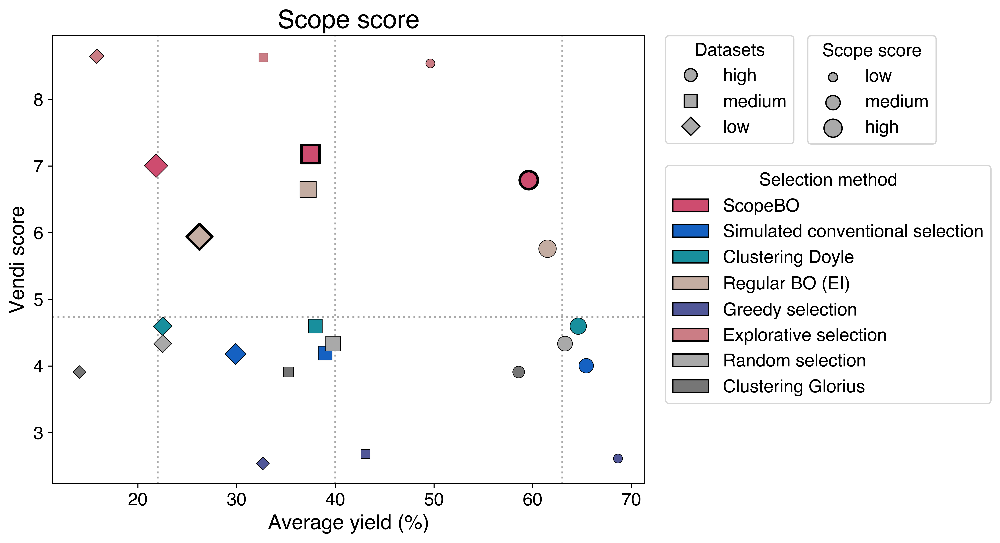

In [11]:
plt.figure(figsize=(11,6), dpi=600)
plt.title("Scope score")
plt.xlabel('Average yield (%)')
plt.ylabel('Vendi score')

# Assign each SCOPE METHOD a color instead of dataset
color_map = {scope_label: all_colors[i] for i, scope_label in enumerate(label_list)}

# Assign each DATASET a marker instead of color
marker_list = ["o","s","D"]
marker_map = {dset: marker_list[i] for i, dset in enumerate(datasets)}

alpha_val = 1

for counter, scope_label in enumerate(label_list):
    map_df = pd.DataFrame(index=datasets, columns=plotting_data["high"].index)
    for dset in datasets:
        map_df.loc[dset] = plotting_data[dset][scope_label]

    for dset in datasets:
        x = map_df.loc[dset, "Average yield"]
        y = map_df.loc[dset, "Vendi score"]
        raw_size_data = map_df.loc[dset, "Scope score"]
        size = size_min + raw_size_data * (size_max - size_min)

        linewidth_val = 2 if size == size_max else 0.5

        plt.scatter(
            x, y, s=size, alpha=alpha_val,
            color=color_map[scope_label],
            edgecolors="k",
            marker=marker_map[dset],
            linewidth=linewidth_val, 
            zorder=2
        )

# Vertical lines for the dataset average yields
for xline in [22, 40, 63]:
    plt.axvline(x=xline, color=all_colors[6], linestyle=':', linewidth=1.5, zorder=1)

# Horizontal line for the Vendi score of the full dataset
plt.axhline(y=full_Vendi, color = all_colors[6], linestyle=":", linewidth=1.5, zorder = 1)

# Legend for datasets (marker)
marker_handles = [
    Line2D([0], [0],
           marker=marker_map[dset],
           color='w',
           markerfacecolor=all_colors[6],
           markeredgecolor='k',
           label=dset,
           markersize=10)
    for dset in datasets
]

# Legend for scope methods (color)
color_handles = [
    Patch(facecolor=color_map[scope_label], edgecolor='k', label=scope_label, alpha=alpha_val)
    for scope_label in label_list
]

# Legend for size (Scope score)
size_labels = ["low", "medium", "high"]
size_vals = [size_min, (size_min + size_max)/2, size_max]
size_handles = [
    plt.scatter([], [], s=s, color=all_colors[6], alpha=1, edgecolors='k', label=f'{lab}')
    for s, lab in zip(size_vals, size_labels)
]

legend_datasets = plt.legend(
    handles=marker_handles,
    title="Datasets",
    loc='upper left',
    bbox_to_anchor=(1.02, 1.02)
)

legend_scores = plt.legend(
    handles=size_handles,
    title="Scope score",
    loc='upper left',
    bbox_to_anchor=(1.26, 1.02)
)

legend_scope = plt.legend(
    handles=color_handles,
    title="Selection method",
    loc='upper left',
    bbox_to_anchor=(1.02, 0.73)
)

plt.gca().add_artist(legend_datasets)
plt.gca().add_artist(legend_scores)

plt.tight_layout()
plt.show()


Plot a summary

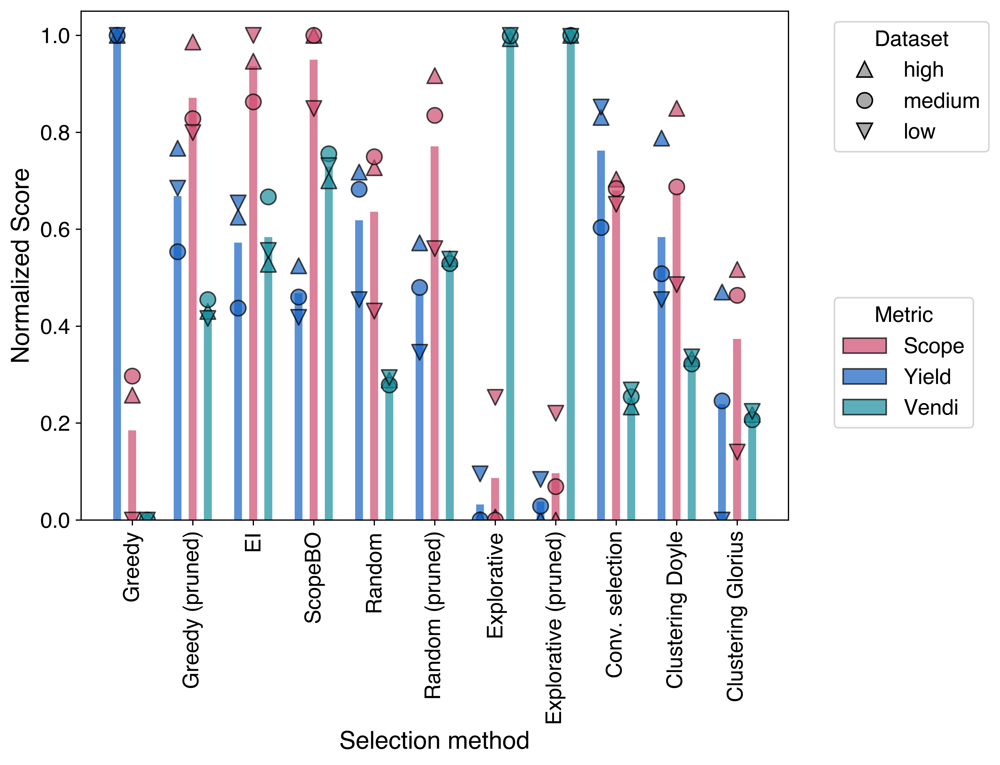

In [12]:
# make a summary plot

# normalize the scores
norm_scores = {}
for dset in datasets:
    df = final_scopes[dset].copy(deep=True)
    for idx in df.index:
        df.loc[idx] = df.loc[idx].apply(lambda x: (x - df.loc[idx].min())/(df.loc[idx].max() - df.loc[idx].min()))
    norm_scores[dset] = df 

records = []
for dataset_name, df in norm_scores.items():
    for idx in df.index:
        for metric in df.columns:
            records.append({
                'Dataset': dataset_name,
                "Acq. Fct.": metric,
                "Metric": idx,
                'Score': df.loc[idx, metric]
            })

long_df = pd.DataFrame(records)
shift = 0.25
offsets = {'Scope': 0, 'Yield': -shift, 'Vendi': shift}
long_df['XOffset'] = long_df["Metric"].map(offsets)

# Positions for each metric
metrics = list(final_scopes["high"].columns)
x_pos_map = {metric: i for i, metric in enumerate(metrics)}
long_df['XBase'] = long_df["Acq. Fct."].map(x_pos_map)
long_df['X'] = long_df['XBase'] + long_df['XOffset']

# Plotting
plt.figure(figsize=(9, 7),dpi=600)
markers = {'high': '^', 'medium': 'o', 'low': 'v'}

cmap = plt.get_cmap('Doyle_cat')

# Get the first three colors from the colormap
colors_list = [cmap(i) for i in range(3)]

# Now assign them in your dictionary
colors = {
    'Scope': colors_list[0],
    'Yield': colors_list[1],
    'Vendi': colors_list[2],
}

# Plot each combination of metric and dataset
for dataset in final_scopes.keys():
    for idx in final_scopes["high"].index:
        subset = long_df[(long_df['Dataset'] == dataset) & (long_df["Metric"] == idx)]
        plt.scatter(
            subset['X'], 
            subset['Score'], 
            marker=markers[dataset],
            color=colors[idx],
            s=100,
            edgecolor='k',
            linewidths=1,
            alpha=0.7
        )

# Legend for Dataset (marker)
dataset_legend = [
    Line2D([0], [0], marker=markers[name], color='w', label=name,
           markerfacecolor=all_colors[6], markeredgecolor='k', markersize=10)
    for name in markers
]

# Legend for metric (color)
index_legend = [
    Patch(facecolor=colors[name], edgecolor='k', label=name, alpha = 0.7)
    for name in colors
]

legend1 = plt.legend(handles=dataset_legend, title='Dataset', loc='upper left', bbox_to_anchor=(1.05, 1))
legend2 = plt.legend(handles=index_legend, title='Metric', loc='lower left', bbox_to_anchor=(1.05, 0.16))
plt.gca().add_artist(legend1)
plt.xticks(ticks=range(len(metrics)), labels=metrics, rotation = 90)
plt.ylabel('Normalized Score')

# calculate averages
avg_scores = (
    long_df
    .groupby(["Acq. Fct.", "Metric"], as_index=False)['Score']
    .mean()
)

# map the averages to the plot positions
avg_scores['XBase'] = avg_scores["Acq. Fct."].map(x_pos_map)
avg_scores['XOffset'] = avg_scores["Metric"].map(offsets)
avg_scores['X'] = avg_scores['XBase'] + avg_scores['XOffset']

# barplot for the averages
bar_width = 0.13
for idx, color in colors.items():
    subset = avg_scores[avg_scores["Metric"] == idx]
    plt.bar(
        subset['X'], 
        subset['Score'], 
        width=bar_width, 
        color=color, 
        alpha=0.7, 
        label=f'{idx} avg',
        zorder=0
    )

plt.xlabel("Selection method")
plt.tight_layout()
plt.show()


In [13]:
average_yields = {"high": 62.97, "medium": 39.84, "low": 22.16}
relative_results = plotting_data.copy()
# convert the yields in a relative yield compared to the dataset average
for dset in datasets:
    relative_results[dset].loc["Average yield"] = relative_results[dset].loc["Average yield"].apply(lambda x: x - average_yields[dset])

# calculate the average and standard deviation across the 3 datasets
arr = np.stack([df.values for df in relative_results.values()])
mean_df = pd.DataFrame(arr.mean(axis=0), index=relative_results["high"].index, columns=relative_results["high"].columns)
std_df  = pd.DataFrame(arr.std(axis=0, ddof=1), index=relative_results["high"].index, columns=relative_results["high"].columns)

Tabular summary of the mean and standard deviation of the results (average yield is the relative average yield in this case)

In [14]:
mean_df.T

,Scope score,Average yield,Vendi score
ScopeBO,0.939362,-2.011966,6.992080
Simulated conventional selection,0.518113,3.111716,4.126732
Clustering Doyle,0.531391,0.050633,4.598061
Regular BO (EI),0.891855,0.006883,6.116512
Greedy selection,0.000000,6.468624,2.612105
Explorative selection,0.033063,-8.922200,8.604880
Random selection,0.480226,0.204546,4.337669
Clustering Glorius,0.097445,-5.687667,3.912000


In [15]:
std_df.T

,Scope score,Average yield,Vendi score
ScopeBO,0.105028,1.556704,1.951684e-01
Simulated conventional selection,0.065629,4.351656,1.056126e-01
Clustering Doyle,0.200910,1.765499,0.000000e+00
Regular BO (EI),0.121045,3.567560,4.697484e-01
Greedy selection,0.000000,3.703171,6.834750e-02
Explorative selection,0.057267,3.845022,5.820930e-02
Random selection,0.144135,0.221992,0.000000e+00
Clustering Glorius,0.116974,2.086346,5.438960e-16


Plot the mean and standard deviation with relative average yields

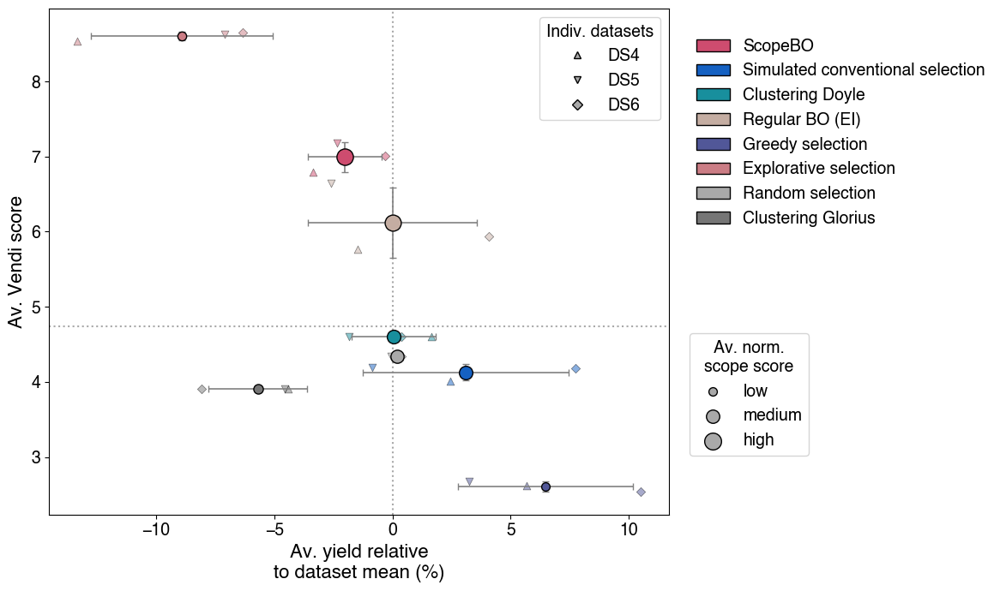

In [16]:
def performance_summary(figsize=(8,7),print_method_legend=True, print_score_legend=True, score_leg_pos = (1.02,0.1), dpi=100, label_list = label_list):

    plt.figure(figsize=figsize,dpi=dpi)
    plt.xlabel('Av. yield relative\nto dataset mean (%)')
    plt.ylabel('Av. Vendi score')

    # Color map for selection methods
    color_map = {scope_label: all_colors[i] for i, scope_label in enumerate(label_list)}

    # markers for the individual datasets
    markers = ["^","v","D"]
    # markers = ["D"]*3

    alpha_val = 1

    # --- Plot each Scope method ---
    for scope_label in label_list:
        # Mean values
        x = mean_df.loc["Average yield", scope_label]
        y = mean_df.loc["Vendi score", scope_label]
        size_raw = mean_df.loc["Scope score", scope_label]

        # Std values (for error bars)
        xerr = std_df.loc["Average yield", scope_label]
        yerr = std_df.loc["Vendi score", scope_label]

        # Scale bubble size
        size = size_min + size_raw * (size_max - size_min)
        # highlight best result
        linewidth_val = 2 if size == size_max else 0.5

        plt.errorbar(
            x, y,
            xerr=xerr, yerr=yerr,
            fmt='o',
            color=color_map[scope_label],
            ecolor='gray',
            elinewidth=1.2,
            linewidth = linewidth_val,
            capsize=3,
            alpha=alpha_val,
            markeredgecolor='k',
            markeredgewidth=1,
            markersize=np.sqrt(size),
            label=scope_label,
            zorder=3
        )

        for i,dset in enumerate(datasets):
            plt.scatter(
                relative_results[dset].loc["Average yield",scope_label],
                relative_results[dset].loc["Vendi score",scope_label],
                marker=markers[i],
                color=color_map[scope_label],
                edgecolors="k",
                linewidths=0.5,
                alpha = 0.5,
                s=40 if i != 2 else 28,
                # s=28,
                label=scope_label,
                zorder=2
            )


    # Vertical line for the dataset average
    plt.axvline(x=0, color=all_colors[6], linestyle=':', linewidth=1.5, zorder=1)
    # Horizontal line for the Vendi score of the full dataset
    plt.axhline(y=full_Vendi, color=all_colors[6], linestyle=':', linewidth=1.5, zorder=1)


    # Selection methods legend
    color_handles = [
        Patch(facecolor=color_map[scope_label], edgecolor='k', label=scope_label, alpha=alpha_val)
        for scope_label in label_list
    ]

    # Scope score legend
    size_labels = ["low", "medium", "high"]
    size_vals = [size_min, (size_min + size_max)/2, size_max]
    size_handles = [
        plt.scatter([], [], s=s, color=all_colors[6], alpha=1, edgecolors='k', label=f'{lab}')
        for s, lab in zip(size_vals, size_labels)
    ]

    if print_method_legend:
        legend_scope = plt.legend(
            handles=color_handles,
            loc='center left',
            frameon =False,
            bbox_to_anchor=(1.02, 0.755)
            )
        plt.gca().add_artist(legend_scope)
    if print_score_legend:
        legend_size = plt.legend(
            handles=size_handles,
            title="Av. norm.\nscope score",
            loc='lower left',
            bbox_to_anchor = score_leg_pos,
            frameon = True
        )
        legend_size.get_title().set_multialignment("center")
        plt.gca().add_artist(legend_size)


    # Dataset legend
    dset_handles = [
        Line2D(
            [0], [0],
            marker=markers[i],
            color='w',
            markerfacecolor=all_colors[6],
            markeredgecolor='k',
            markersize=6,
            linestyle='None',
            label=dset
        )
        for i, dset in enumerate(["DS4","DS5","DS6"])
        # for i, dset in enumerate([""])
    ]
    dset_legend = plt.legend(
        handles = dset_handles,
        title = "Indiv. datasets",
        loc = "upper right",
        frameon = True,
    )

    for text in dset_legend.get_texts():
        text.set_fontweight('bold')

    plt.tight_layout()
    plt.show()

performance_summary()


Version of this plot for the manuscript

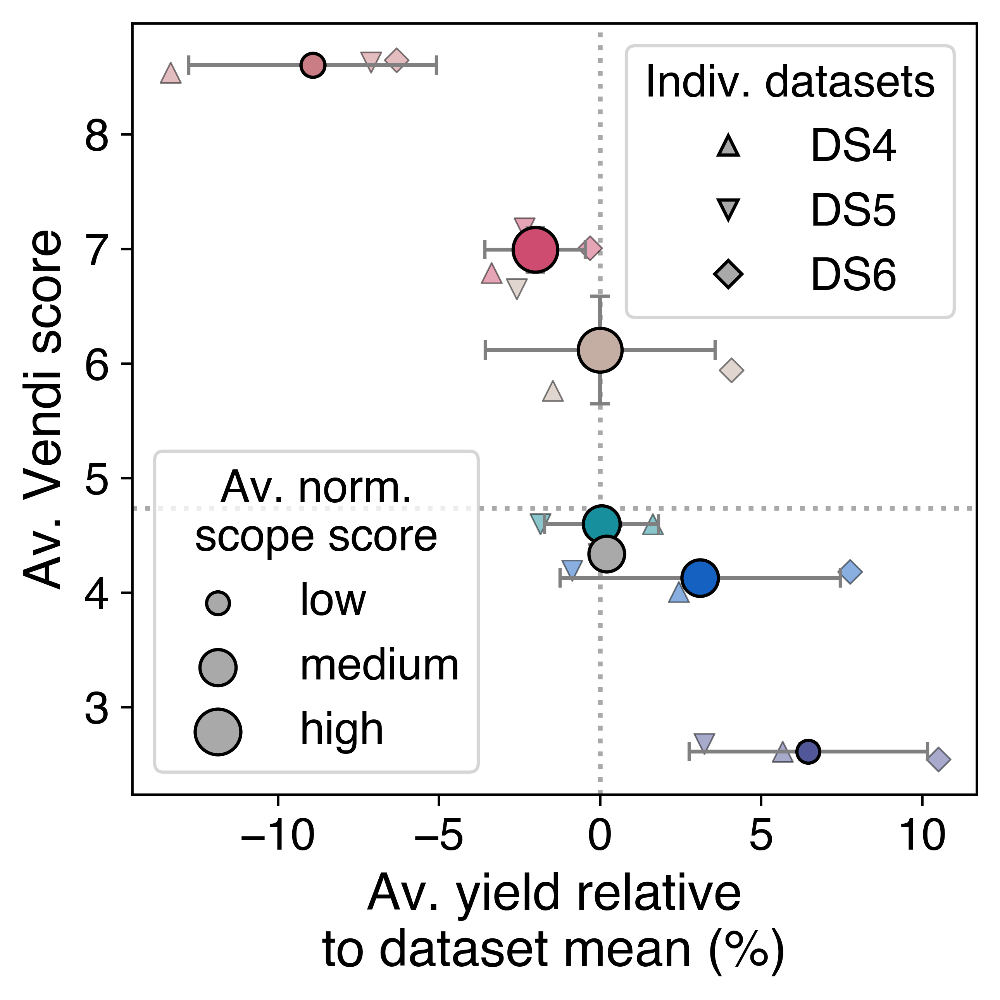

In [17]:
label_list = ["ScopeBO",
              "Simulated conventional selection",
              "Clustering Doyle",
              "Regular BO (EI)",
              "Greedy selection",
              "Explorative selection",
              "Random selection"]
performance_summary(label_list=label_list, print_method_legend=False, print_score_legend=True,score_leg_pos=(0,0),dpi=600, figsize=(4.4,4.4))

### Statistical Testing

To test for statistically significant differences between the selection methods, we carried out a Friedman test for each dataset to test if the scope scores are similar between the methods.

Note that we can not carry out these tests for clustering-based methods as they are deterministic and do not provide a distribution of scope score results.

In [ ]:
# read in the data
all_scope_scores = {}
all_vendi_scores = {}
all_av_yields = {}
renaming = {"Greedy_no-pruning":"Greedy",
            "Greedy_with-pruning":"Greedy (pruned)",
            "EI_no-pruning":"EI",
            "EI_with-pruning":"ScopeBO",
            "Random_no-pruning":"Random",
            "Random_with-pruning":"Random (pruned)",
            "Explorative_no-pruning":"Explorative",
            "Explorative_with-pruning":"Explorative (pruned)",
            "Conv. selection":"Conv. selection"}

for scope_type in ["scope","vendi","yield"]:
    for dset in datasets:
        scores = pd.DataFrame(np.nan, index=final_scopes["high"].columns, columns=list(range(40)))
        scores.drop(index=["Clustering Doyle","Clustering Glorius"], inplace=True)
        for acq in ["EI","Random","Greedy","Explorative","Conv. selection"]:
            if acq.lower() == "random":
                acq_label = "random-selection"
            elif acq.lower() == "conv. selection":
                acq_label = "human-like-acq"
            else:
                acq_label = acq.lower()
            for pruning in [True,False]:
                if acq.lower() == "conv. selection" and pruning:
                    continue  # only read the human-like acq once (no pruning distinction)
                if pruning:
                    pruning_label = "_with-pruning"
                else:
                    pruning_label = "_no-pruning"
                if acq.lower() == "conv. selection":
                    pruning_label = ""
                _, dict_data = Benchmark().get_metric_overview(bounds = get_bounds(dset), budget = 27,
                                                    name_results=f"Results_Data/{dset}-dataset/{acq_label}{pruning_label}", 
                                                    type_results=scope_type)
                for seed_dict in dict_data.values():
                    for seed, df in seed_dict.items():
                        scores.loc[renaming[acq+pruning_label], seed] = df.loc[8,scope_type]
        if scope_type == "scope":
            all_scope_scores[dset] = scores
        elif scope_type == "vendi":
            all_vendi_scores[dset] = scores
        elif scope_type == "yield":
            all_av_yields[dset] = scores

In [ ]:
from scipy.stats import friedmanchisquare
print("Friedman test results for Scope scores:\n")
for dset in datasets:
    print("Dataset", dset)
    res = friedmanchisquare(*all_scope_scores[dset].values)
    print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)
    print("\n")

Friedman test results for Scope scores:

Dataset high
Friedman statistic: 210.69677959012975 
p-value: 3.5475869175740786e-41


Dataset medium
Friedman statistic: 120.35830891586455 
p-value: 2.795993777472677e-22


Dataset low
Friedman statistic: 233.25010473397572 
p-value: 6.0789173161166525e-46




In [ ]:
print("Friedman test results for Vendi scores:\n")
for dset in datasets:
    print("Dataset", dset)
    res = friedmanchisquare(*all_vendi_scores[dset].values)
    print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)
    print("\n")

Friedman test results for Vendi scores:

Dataset high
Friedman statistic: 304.2060732984293 
p-value: 5.240183397649354e-61


Dataset medium
Friedman statistic: 308.21537816886666 
p-value: 7.339798343273446e-62


Dataset low
Friedman statistic: 309.64577656675755 
p-value: 3.639739746061195e-62




In [ ]:
print("Friedman test results for average yields:\n")
for dset in datasets:
    print("Dataset", dset)
    res = friedmanchisquare(*all_av_yields[dset].values)
    print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)
    print("\n")

Friedman test results for average yields:

Dataset high
Friedman statistic: 197.9757423672104 
p-value: 1.705829632290951e-38


Dataset medium
Friedman statistic: 134.52992884051912 
p-value: 3.2502869350344517e-25


Dataset low
Friedman statistic: 244.51780477586934 
p-value: 2.500478814405987e-48




Differences between the selection methods were found (null hypothesis rejected as p < 5%) for all metrics. Thus, we continue with two-sided Wilcoxon tests between ScopeBO and the other methods, controlling for the initiation seed, while correcting for multiple comparisons with the Holm-Bonferroni method.

In [ ]:
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

def wilcoxon_tests(data):
    """
    Function for performing pairwise Wilcoxon signed-rank tests 
    comparing ScopeBO to each other method, with Holm-Bonferroni correction.
    """
    for dset in datasets:
        print(f"Dataset: {dset}")
        df = data[dset]
        methods = df.index.tolist()
        reference = methods[3]  # ScopeBo is the 4th method in index of the df

        comparisons = []
        p_values = []

        for method in methods:
            if method == reference:
                continue
            
            # Two-sided Wilcoxon of ScopeBo versus the other method
            stat, p = wilcoxon(
                df.loc[reference],
                df.loc[method],
                alternative= "two-sided"
            )
            
            comparisons.append(method)
            p_values.append(p)

        # Holm-Bonferroni correction
        reject, pvals_corrected, _, _ = multipletests(
            p_values,
            alpha=0.05,
            method='holm'
        )
        results = pd.DataFrame({
            "Comparison": comparisons,
            "Corrected p-value": pvals_corrected,
            "ScopeBO higher?": [np.mean(df.loc[reference].values) > np.mean(df.loc[comp].mean()) for comp in comparisons],
            "Different?": reject,
        })

        print(f"Reference method: {reference}")
        display(results)
        print("\n")

In [ ]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):\n")
wilcoxon_tests(all_scope_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):

Dataset: high
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.091394e-10,True,True
1,Greedy (pruned),7.954479e-01,True,False
2,EI,5.765879e-01,True,False
3,Random,3.532420e-04,True,True
4,Random (pruned),5.765879e-01,True,False
5,Explorative,2.910383e-11,True,True
6,Explorative (pruned),2.910383e-11,True,True
7,Conv. selection,9.750414e-05,True,True




Dataset: medium
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.888293e-08,True,True
1,Greedy (pruned),5.493523e-01,True,False
2,EI,5.493523e-01,True,False
3,Random,1.037728e-01,True,False
4,Random (pruned),5.493523e-01,True,False
5,Explorative,1.888293e-08,True,True
6,Explorative (pruned),7.799827e-09,True,True
7,Conv. selection,1.037728e-01,True,False




Dataset: low
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,2.910383e-11,True,True
1,Greedy (pruned),2.317373e-01,True,False
2,EI,1.782434e-03,False,True
3,Random,1.850822e-08,True,True
4,Random (pruned),8.928451e-06,True,True
5,Explorative,4.692993e-10,True,True
6,Explorative (pruned),4.201866e-10,True,True
7,Conv. selection,3.030290e-04,True,True


In [ ]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Vendi score):\n")
wilcoxon_tests(all_vendi_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Vendi score):

Dataset: high
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.455192e-11,True,True
1,Greedy (pruned),1.455192e-11,True,True
2,EI,6.912160e-11,True,True
3,Random,1.455192e-11,True,True
4,Random (pruned),6.912160e-11,True,True
5,Explorative,1.455192e-11,False,True
6,Explorative (pruned),1.455192e-11,False,True
7,Conv. selection,1.455192e-11,True,True




Dataset: medium
Reference method: ScopeBO


Exact p-value calculation does not work if there are zeros. Switching to normal approximation.


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.455192e-11,True,True
1,Greedy (pruned),1.455192e-11,True,True
2,EI,2.212216e-05,True,True
3,Random,1.455192e-11,True,True
4,Random (pruned),1.455192e-11,True,True
5,Explorative,1.455192e-11,False,True
6,Explorative (pruned),1.455192e-11,False,True
7,Conv. selection,1.455192e-11,True,True




Dataset: low
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.455192e-11,True,True
1,Greedy (pruned),1.455192e-11,True,True
2,EI,1.455192e-11,True,True
3,Random,1.455192e-11,True,True
4,Random (pruned),1.455192e-11,True,True
5,Explorative,1.455192e-11,False,True
6,Explorative (pruned),1.455192e-11,False,True
7,Conv. selection,1.455192e-11,True,True


In [ ]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (average yields):\n")
wilcoxon_tests(all_av_yields)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (average yields):

Dataset: high
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,7.639755e-10,False,True
1,Greedy (pruned),3.778606e-04,False,True
2,EI,1.836481e-01,False,False
3,Random,1.997362e-02,False,True
4,Random (pruned),4.049377e-01,False,False
5,Explorative,3.819878e-11,True,True
6,Explorative (pruned),1.455192e-11,True,True
7,Conv. selection,1.035005e-07,False,True




Dataset: medium
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.365082e-06,False,True
1,Greedy (pruned),6.047802e-01,False,False
2,EI,1.000000e+00,True,False
3,Random,9.622770e-02,False,False
4,Random (pruned),1.000000e+00,False,False
5,Explorative,9.702489e-09,True,True
6,Explorative (pruned),4.467438e-09,True,True
7,Conv. selection,4.232519e-01,False,False




Dataset: low
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,2.728484e-10,False,True
1,Greedy (pruned),3.001333e-10,False,True
2,EI,1.044082e-07,False,True
3,Random,5.359714e-01,False,False
4,Random (pruned),1.027994e-01,True,False
5,Explorative,1.018634e-10,True,True
6,Explorative (pruned),1.018634e-10,True,True
7,Conv. selection,1.840817e-09,False,True


### Scope visualization

Print representative UMAPs (random seed resulting in scope score closest to the average scope score for the ScopeBO scopes; same seed applied to other selection methods) and the corresponding scopes

In [ ]:
def find_av_random_seed(name_results, dset, batch_pruning, budget=27):
    """Finds the random seed that give the scope with a scope score closet to the average performance."""

    _, dict_dfs_raw_data = Benchmark.get_metric_overview(bounds=get_bounds(dset),budget=budget,type_results="scope", 
                                name_results=name_results)

    # dict_dfs_raw_data contains the a dict for each batch-pruning 
    # combination which in turn contains a dict of the raw data for the differnt random seeds
    # --> restrict to the relevant data (batch size 2 and no Vendi pruning)
    dfs_raw_data = dict_dfs_raw_data[batch_pruning]

    # collect the scope scores
    # NOTE: the indices are the (zero-indexed) rounds --> round 8 is the full scope of 27 samples
    score_dict = {seed: df.loc[8,"scope"] for seed,df in dfs_raw_data.items()}
    av_score = np.mean(np.array(list(score_dict.values())))

    # calculate the absolute difference to the average score
    score_diff = {seed: abs(score-av_score) for seed,score in score_dict.items()}

    # get the seed that is closest to the average
    av_seed = min(score_diff,key=score_diff.get)

    return av_seed


def get_umap(name_results, hyperpar="balanced_b3_V13", dset="medium", seed = None,figsize=(2.7,2.7), show_colorbar=False):

    if seed is None:
        seed = find_av_random_seed(name_results= name_results,
                            dset = dset, batch_pruning= "_".join(hyperpar.split("_")[1:]))
    print("Depicted seed:",seed)
    Benchmark().track_samples(filename_umap=f"./../Amide_data/Datasets/umap_subs_{dset}.csv",
                            filename_data=f"27{hyperpar}_s{seed}.csv",
                            bounds=get_bounds(dset),
                            hide_axis = True, obj_plot_bounds=(1,0),
                            filename_labelled=f"./../Amide_data/Datasets/amide_dset_dft_subs_{dset}-yielding.csv",
                            name_results= name_results+ "/raw_data", show_colorbar= show_colorbar,
                            label_round=False, display_cut_samples=False, figsize = figsize, size_scaling = 0.3, dpi=600, cbar_scaling=100)
    
    return seed

UMAP for ScopeBO (dataset high):

Depicted seed: 12
Scope score: 0.218
Average yield: 0.599
Vendi score: 6.511


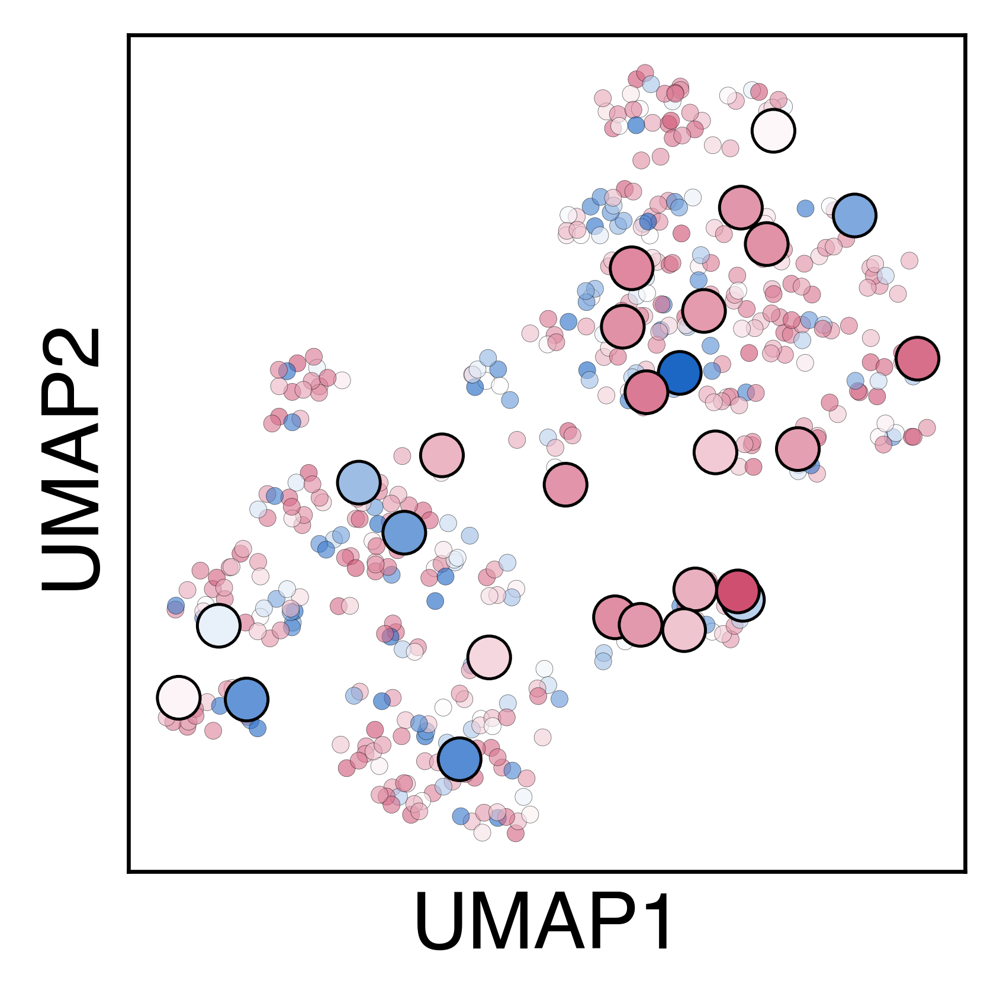

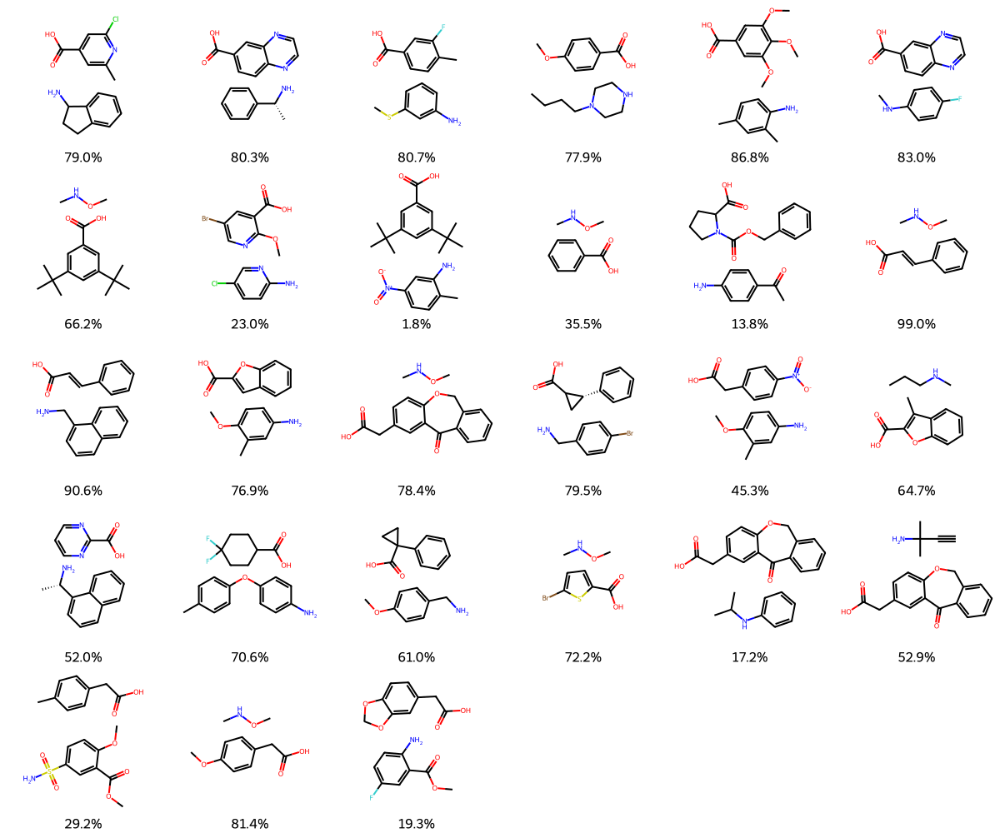

UMAP for Regular BO (EI) (dataset high):

Depicted seed: 12
Scope score: 0.107
Average yield: 0.633
Vendi score: 4.111


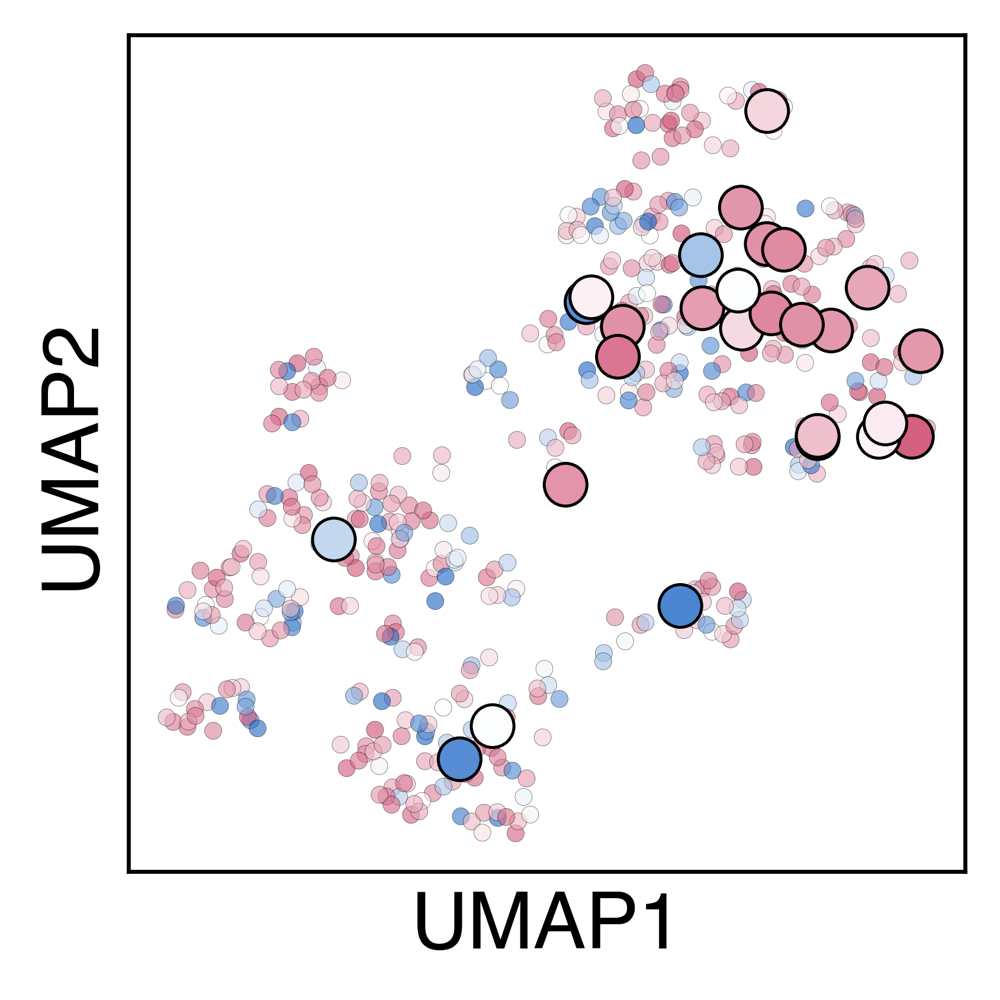

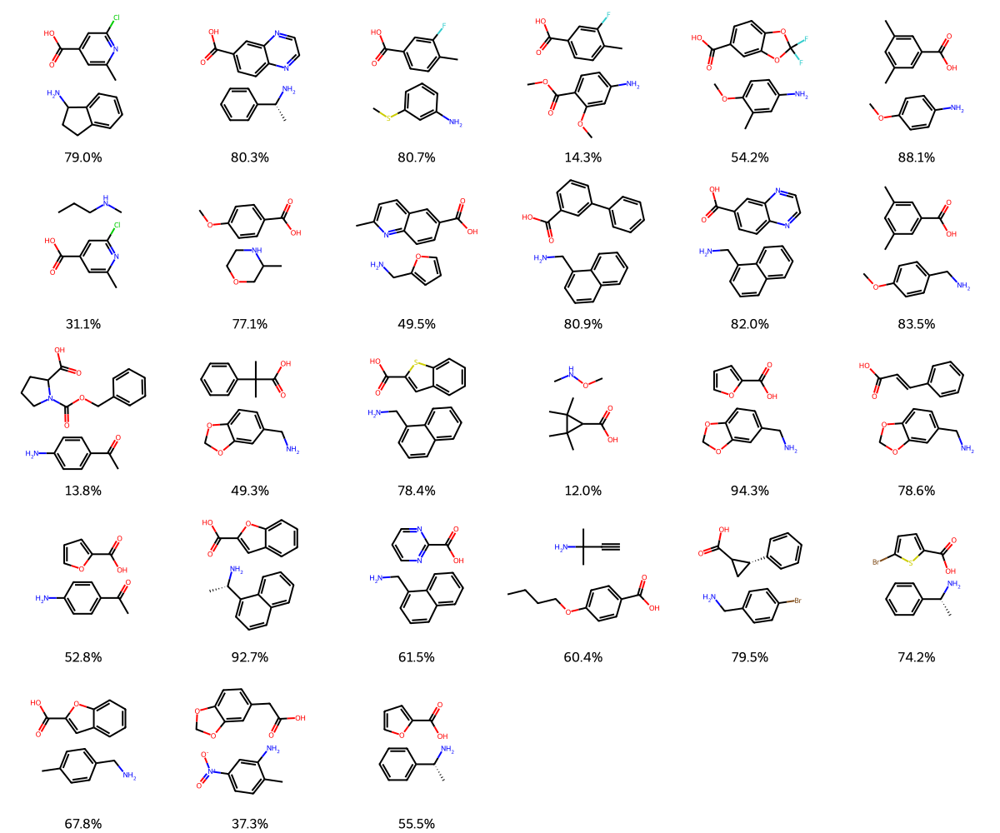

UMAP for conventional selection (dataset high):

Depicted seed: 12
Scope score: 0.053
Average yield: 0.680
Vendi score: 3.311


FixedFormatter should only be used together with FixedLocator


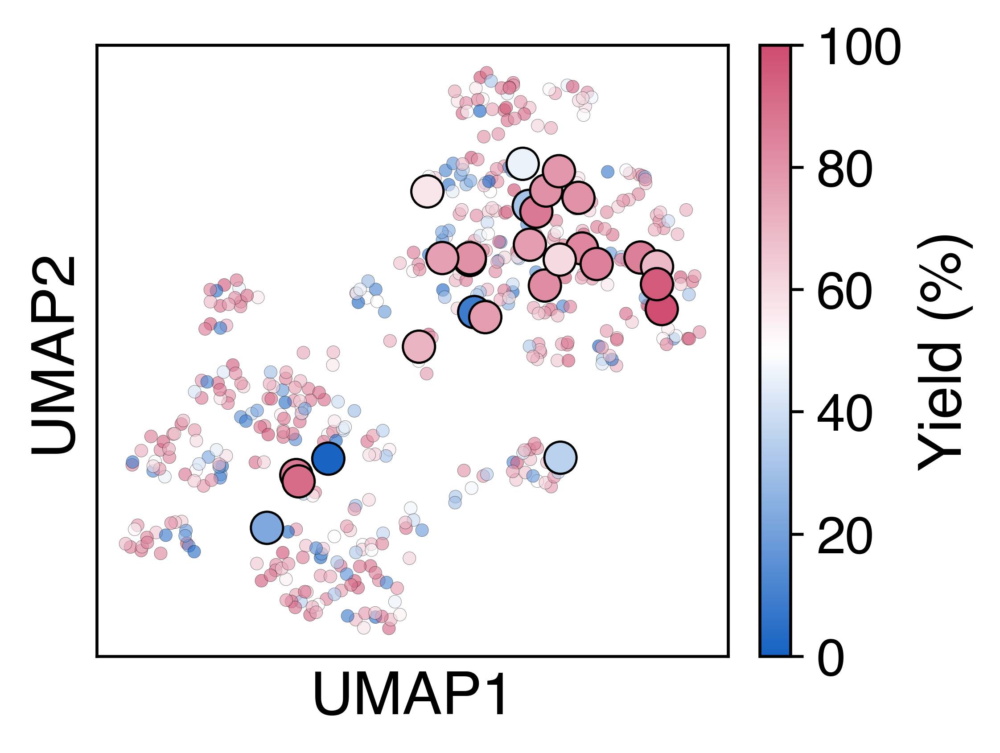

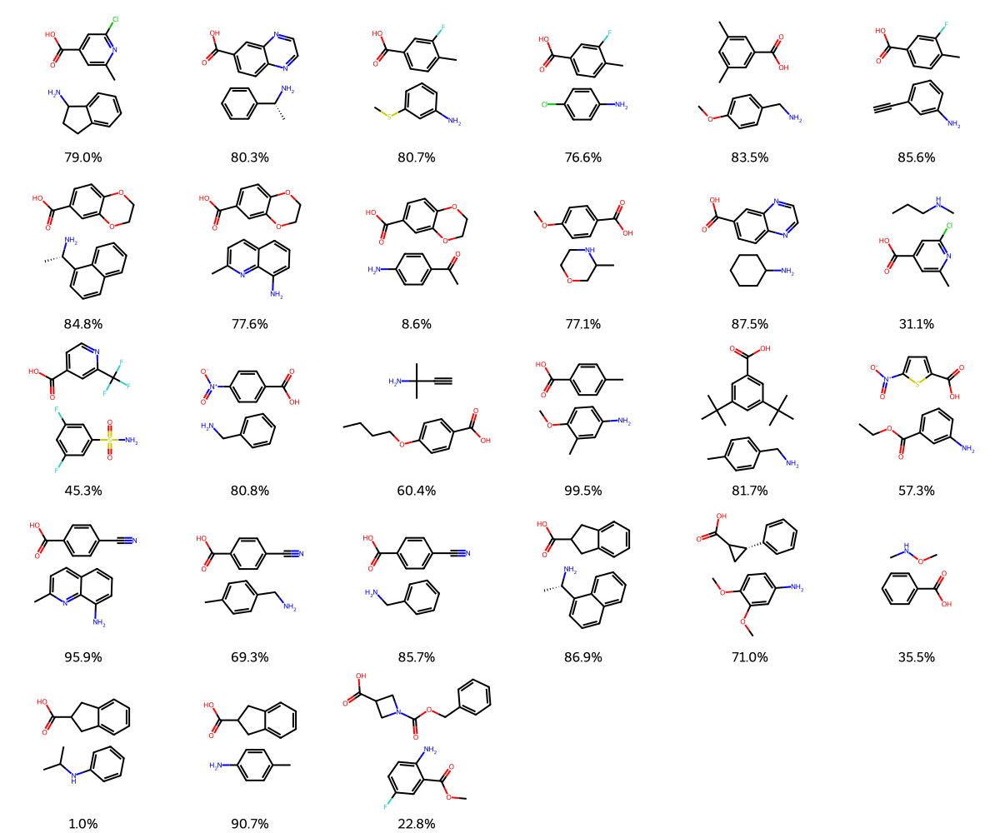

UMAP for ScopeBO (dataset medium):

Depicted seed: 21
Scope score: 0.199
Average yield: 0.382
Vendi score: 6.456


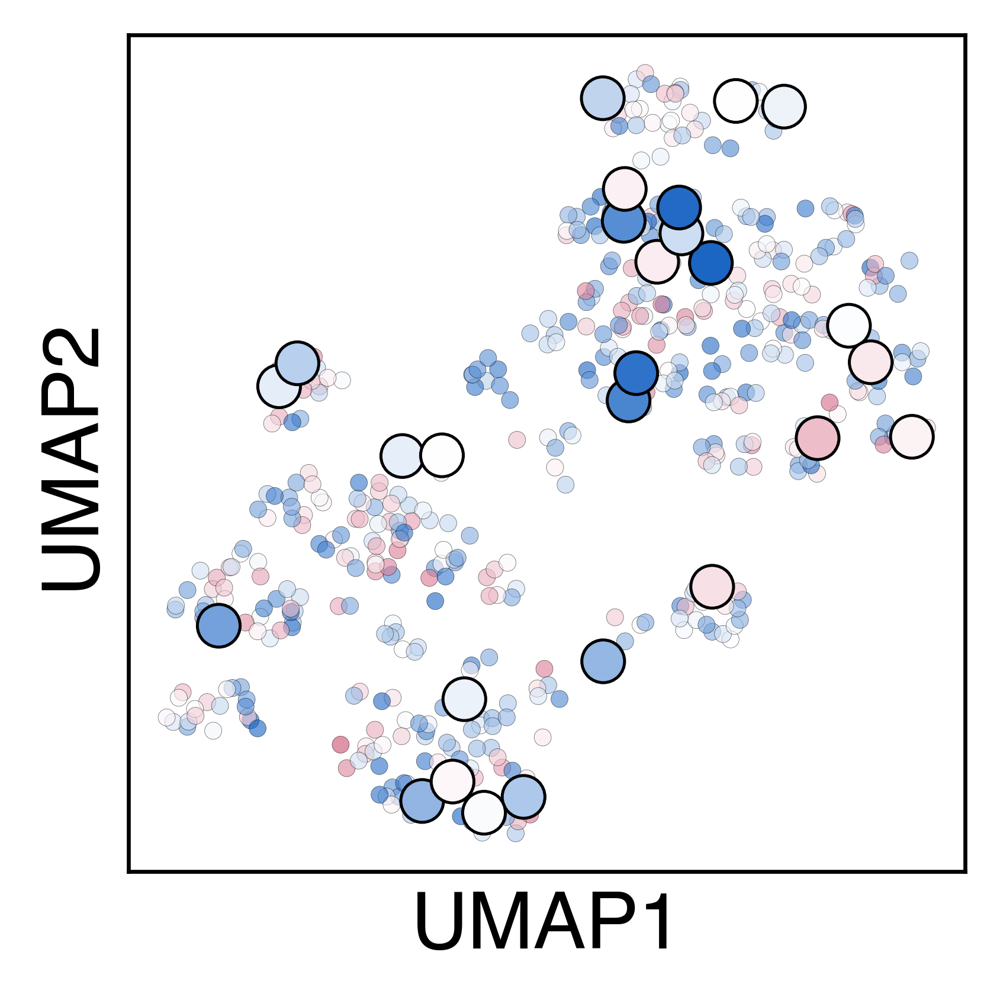

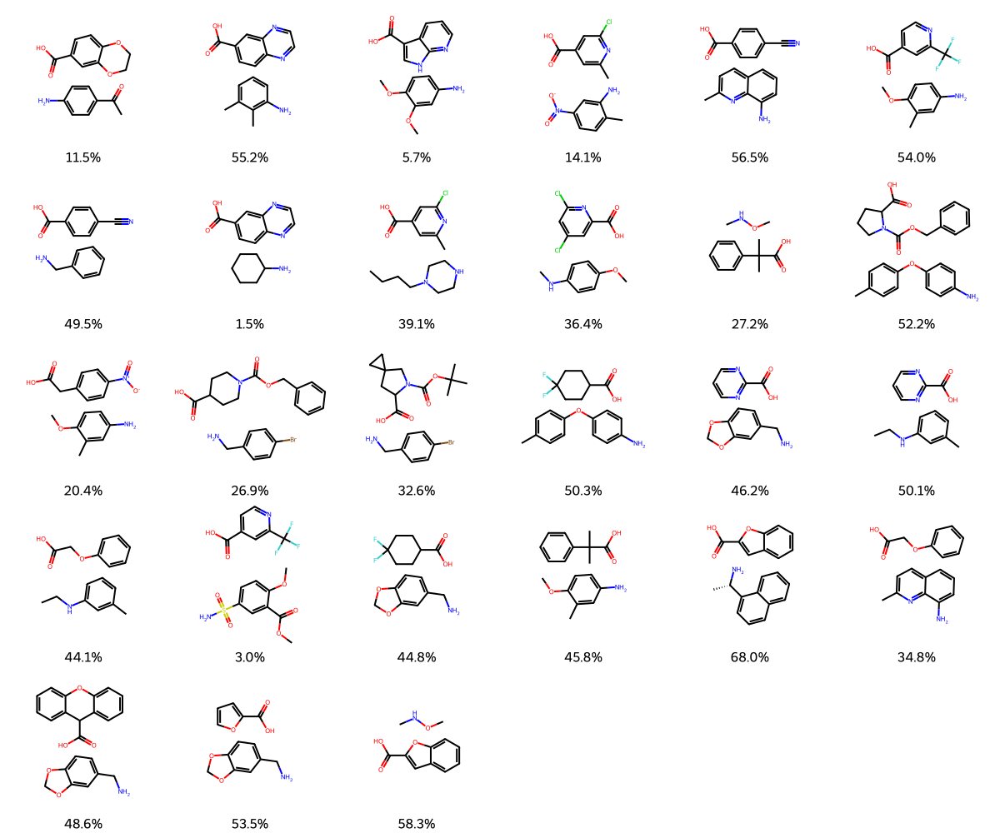

UMAP for Regular BO (EI) (dataset medium):

Depicted seed: 21
Scope score: 0.044
Average yield: 0.361
Vendi score: 4.660


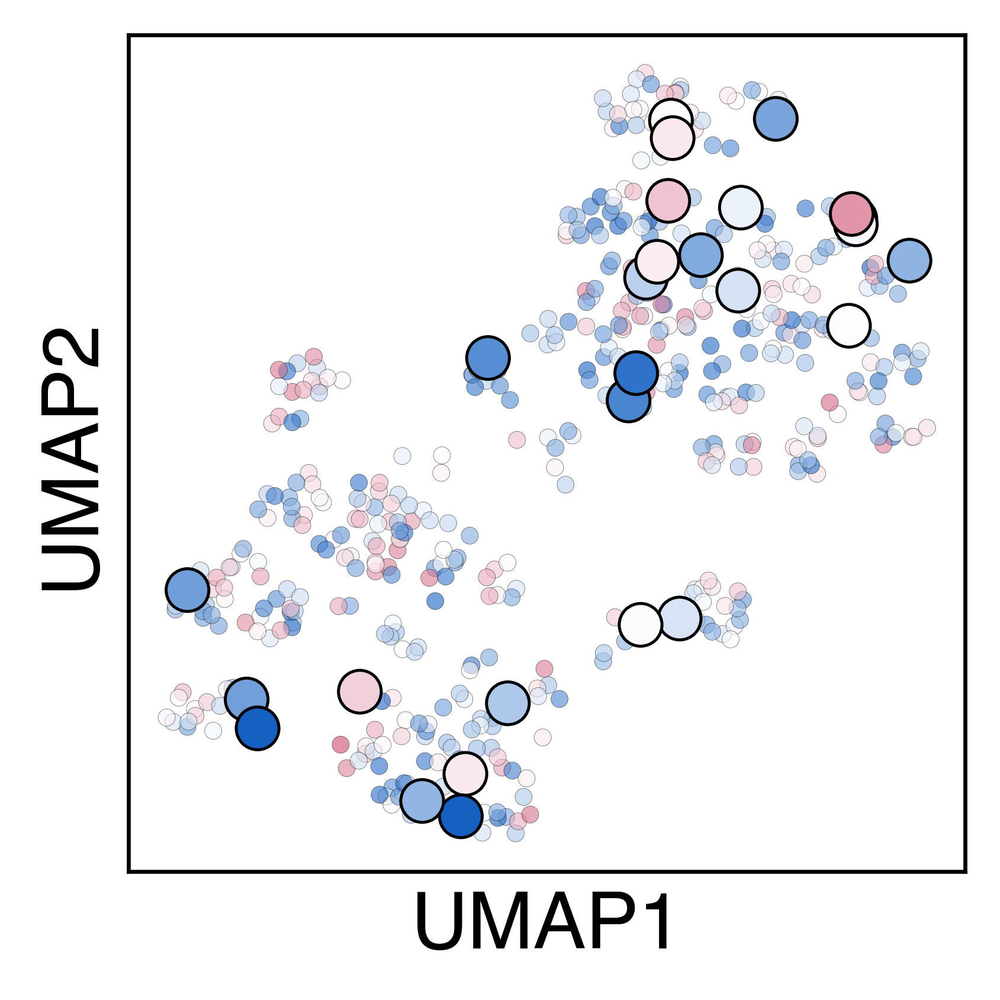

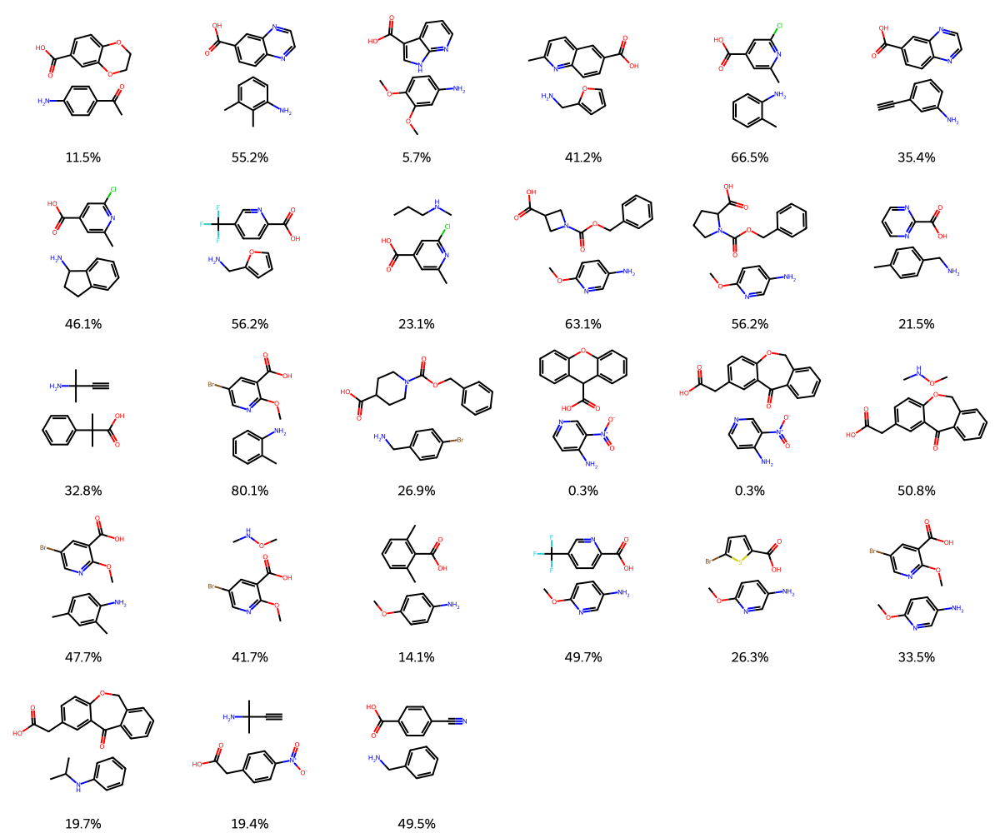

UMAP for conventional selection (dataset medium):

Depicted seed: 21
Scope score: -0.009
Average yield: 0.336
Vendi score: 3.588


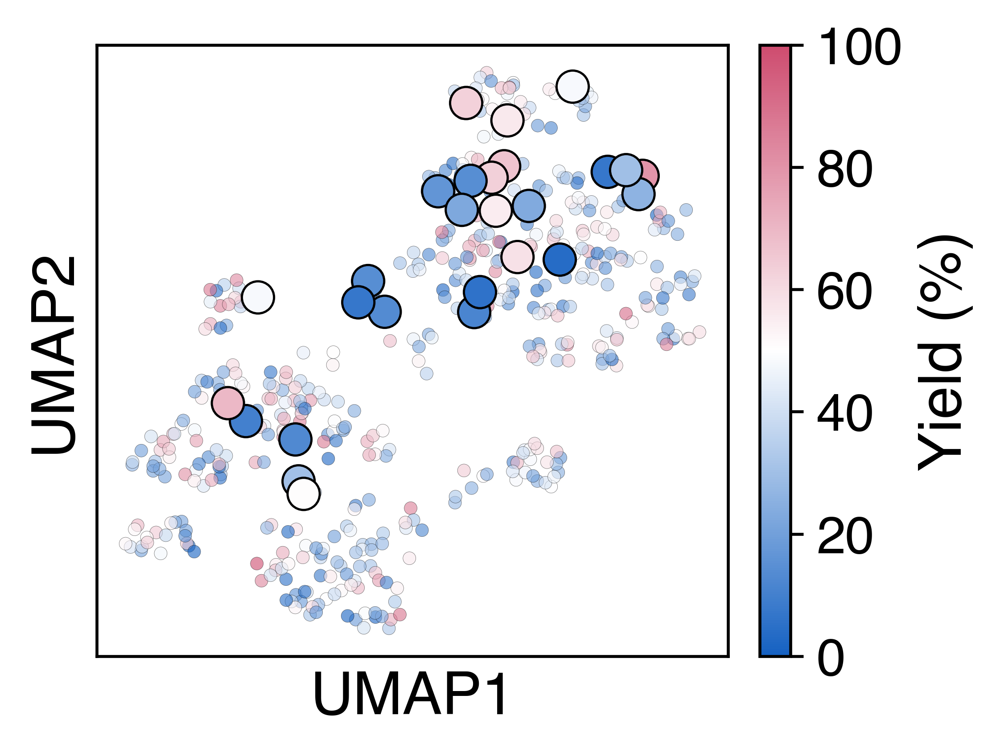

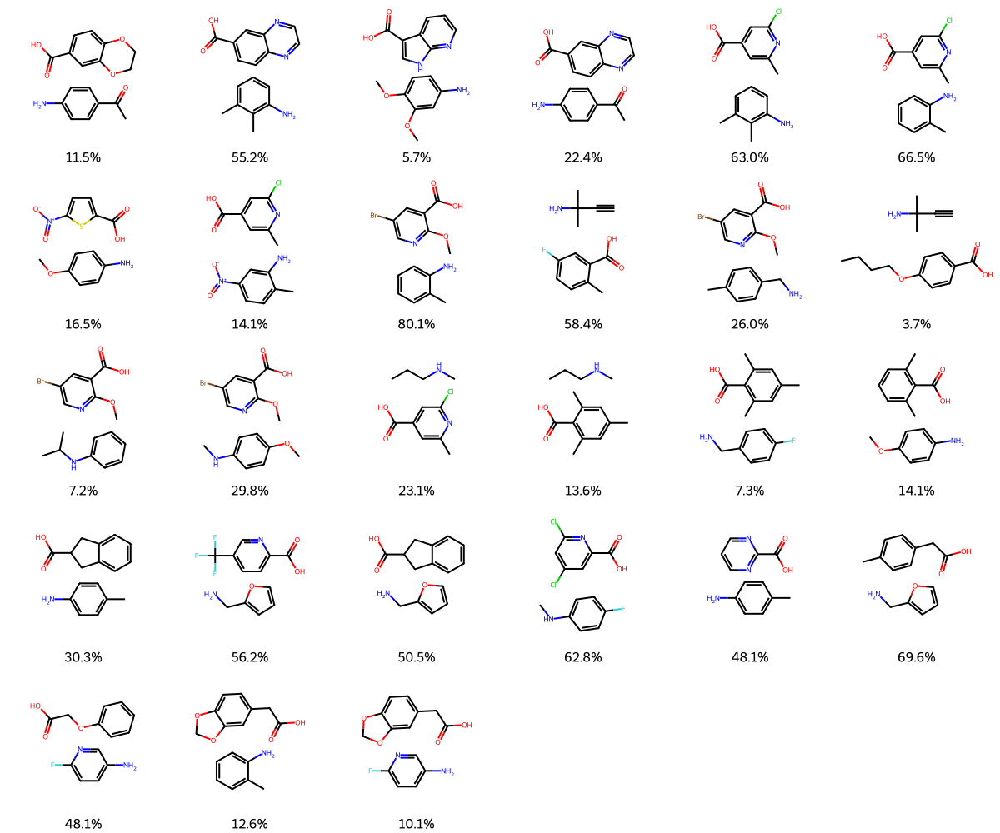

UMAP for ScopeBO (dataset low):

Depicted seed: 13
Scope score: 0.192
Average yield: 0.228
Vendi score: 6.327


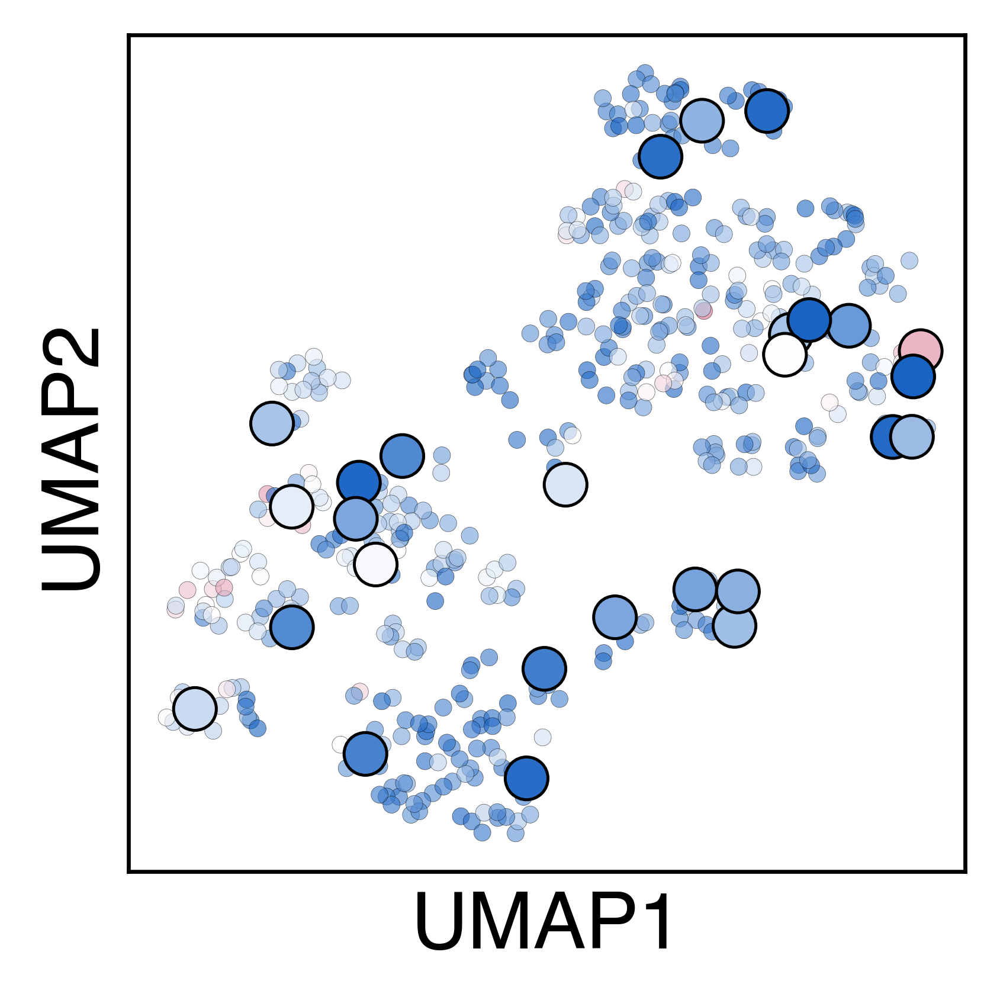

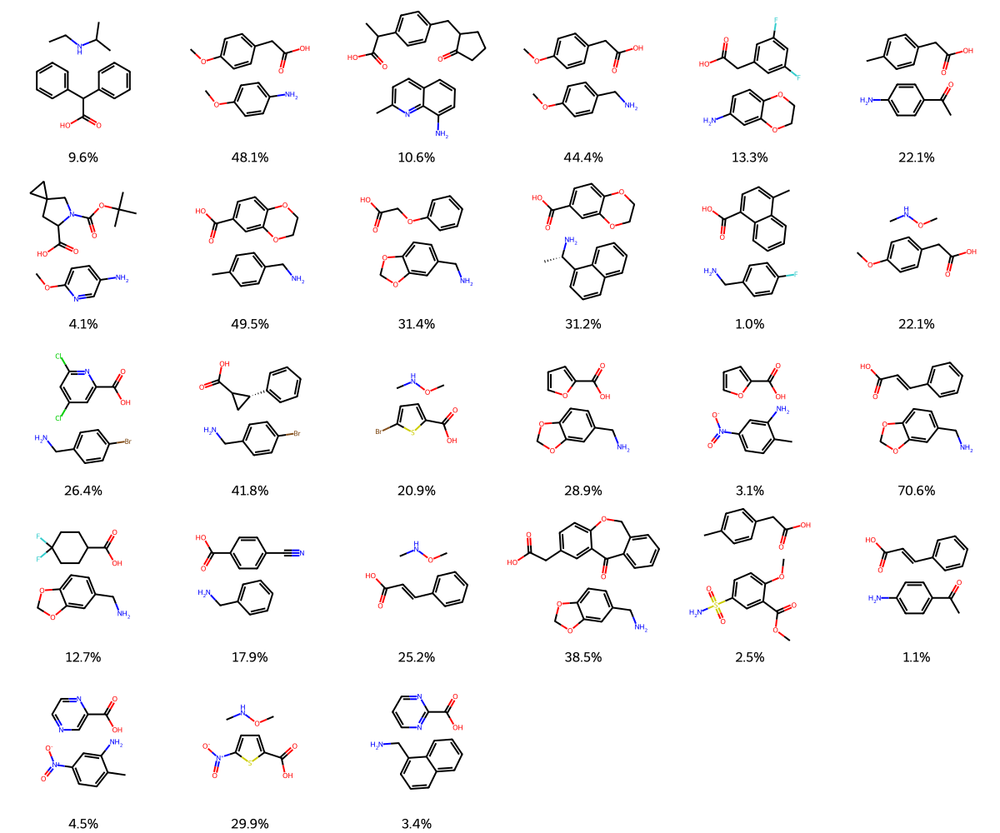

UMAP for Regular BO (EI) (dataset low):

Depicted seed: 13
Scope score: 0.305
Average yield: 0.303
Vendi score: 5.618


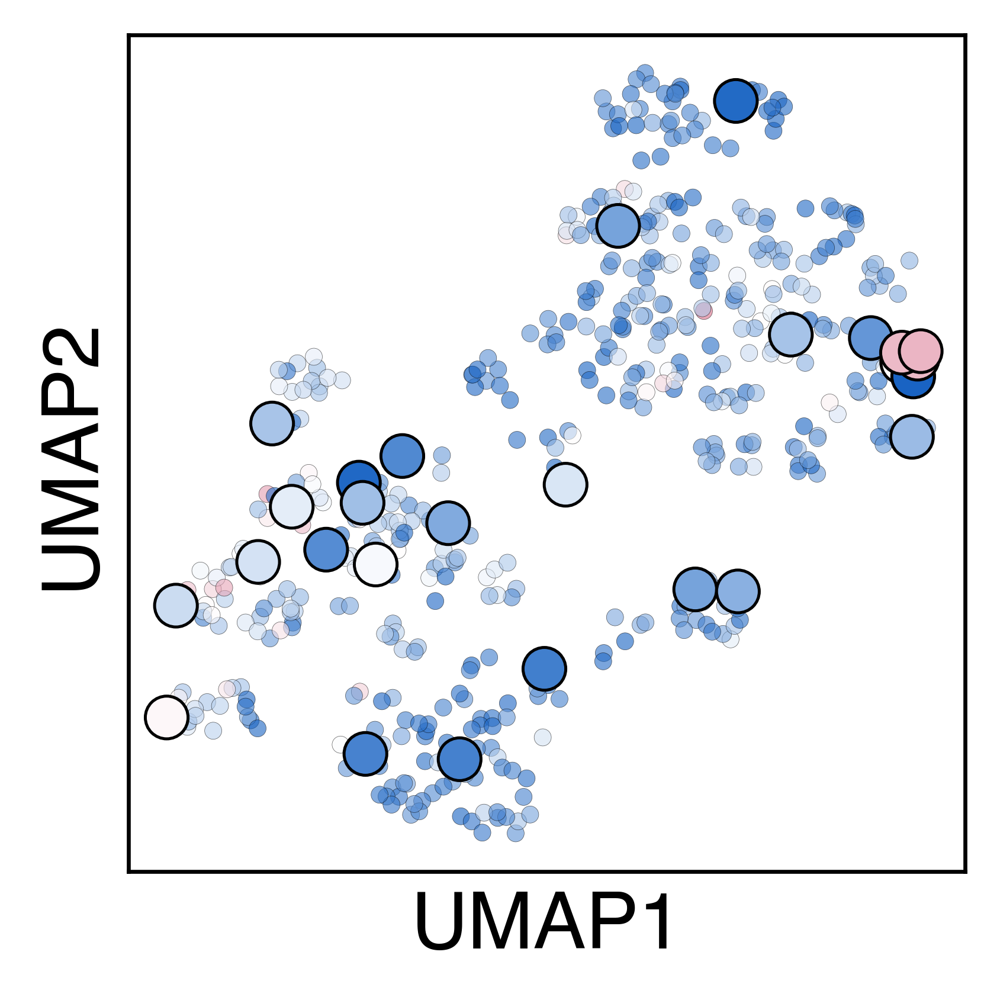

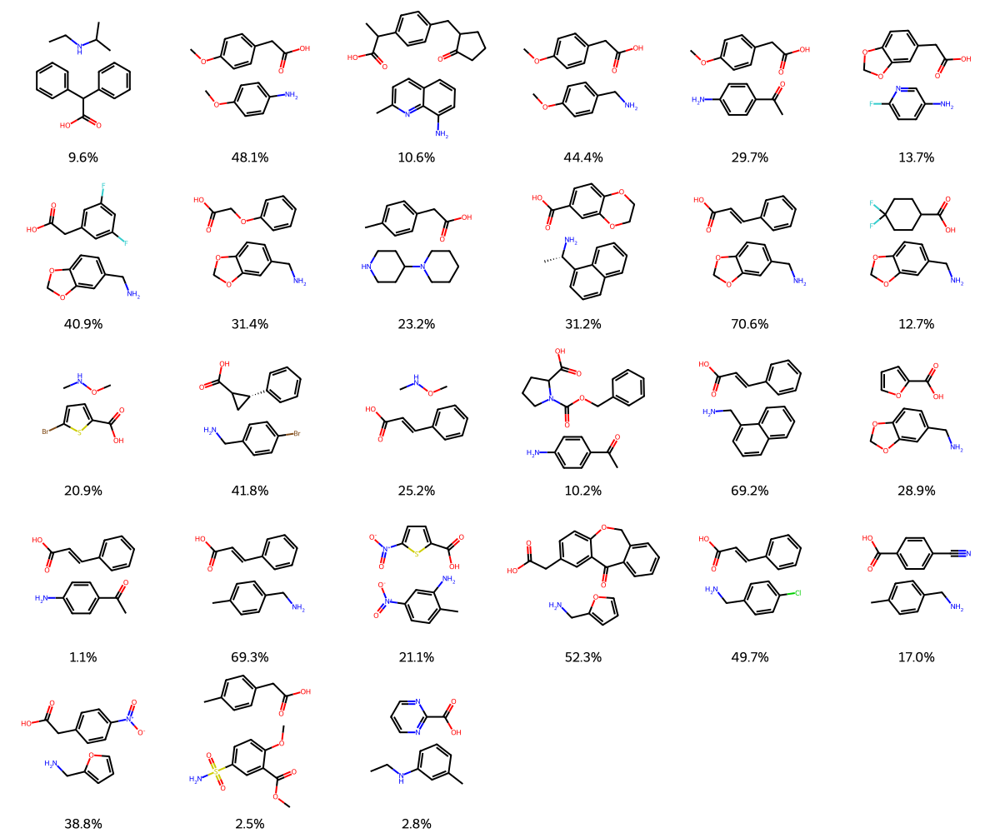

UMAP for conventional selection (dataset low):

Depicted seed: 13
Scope score: 0.195
Average yield: 0.369
Vendi score: 4.104


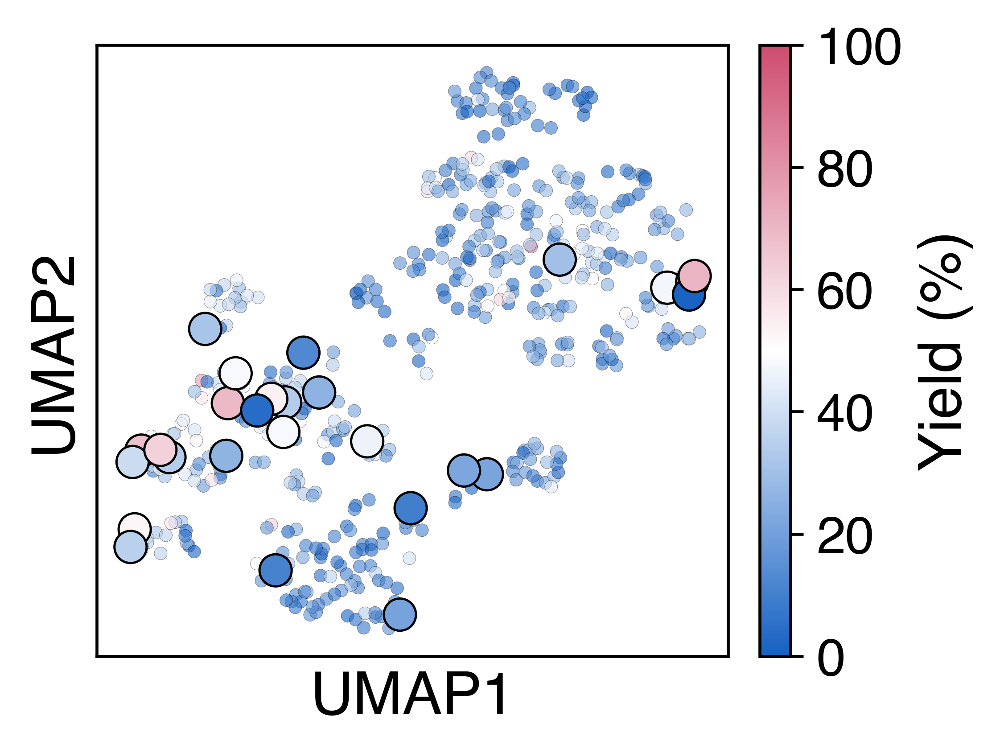

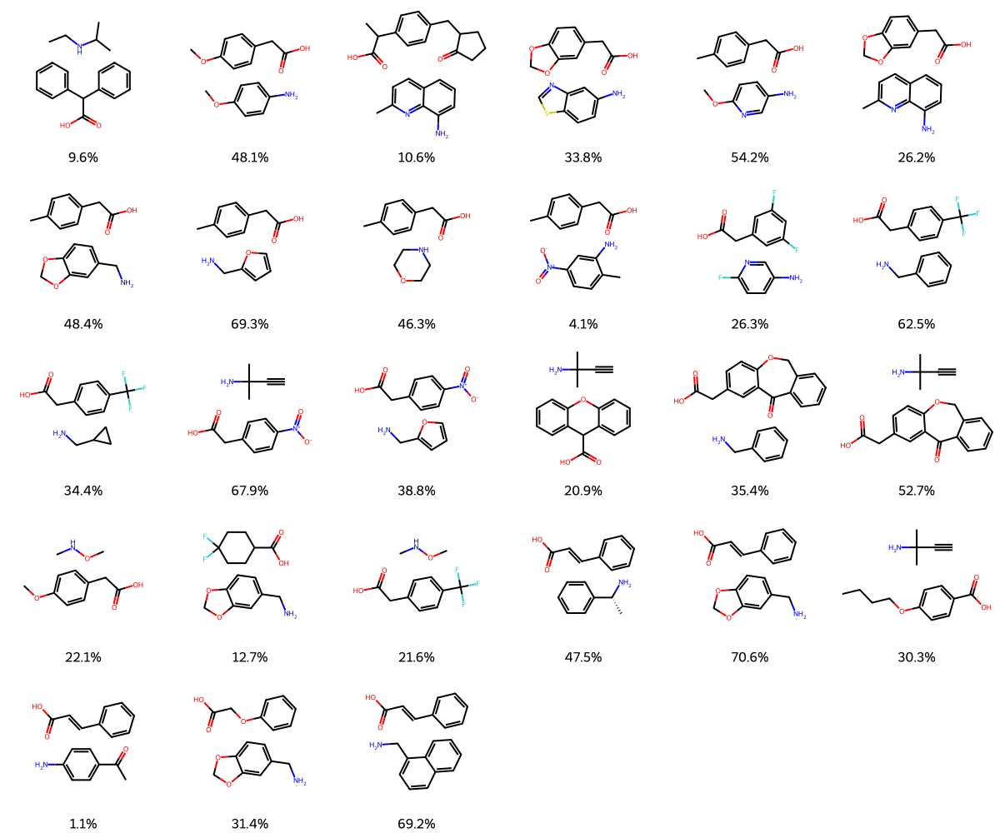

In [ ]:
for dset in datasets:
    print(f"UMAP for ScopeBO (dataset {dset}):\n")
    seed = get_umap(name_results=f"./Results_Data/{dset}-dataset/ei_with-pruning",dset = dset, show_colorbar = False, figsize = (2.7, 2.7))
    Benchmark().show_scope(filename_data=f"27balanced_b3_V13_s{seed}.csv", name_results=f"./Results_Data/{dset}-dataset/ei_with-pruning/raw_data/", by_round=False,
                           label_suffix="%",scale_values=100, round_values=1)
    print(f"UMAP for Regular BO (EI) (dataset {dset}):\n")
    get_umap(name_results=f"./Results_Data/{dset}-dataset/ei_no-pruning", dset = dset, hyperpar="balanced_b3_V0", seed=seed, figsize = (2.7, 2.7))
    Benchmark().show_scope(filename_data=f"27balanced_b3_V0_s{seed}.csv", name_results=f"./Results_Data/{dset}-dataset/ei_no-pruning/raw_data/", by_round=False,
                           label_suffix="%",scale_values=100, round_values=1)
    print(f"UMAP for conventional selection (dataset {dset}):\n")
    get_umap(name_results=f"./Results_Data/{dset}-dataset/human-like-acq", hyperpar="greedy_b3_V5", seed = seed, dset = dset, figsize = (3.63, 2.7), show_colorbar=True)
    Benchmark().show_scope(filename_data=f"27greedy_b3_V5_s{seed}.csv", name_results=f"./Results_Data/{dset}-dataset/human-like-acq/raw_data/", by_round=False,
                           label_suffix="%",scale_values=100, round_values=1)

In [ ]:
# create a csv file in the style of the result files of Benchmark.collect_data() 
# runs to use the umap printing function for the clustering data

# read in the clustering data
df_cluster = pd.read_csv("./Results_Data/Cluster_Scopes/scope_doyle_samples_high.csv", index_col = 0)
df_cluster_samples = df_cluster.loc[df_cluster["yield"] != "PENDING"].copy()
df_cluster_samples.head(3)

,UMAP1,UMAP2,clusters,yield
CC1CCCNC1.O=C(O)Cc1ccc2c(c1)OCO2,-0.134908,5.779784,32,0.7875994
CCNC(C)C.Cc1ccc2cc(C(=O)O)ccc2n1,5.524085,11.442644,16,0.131192
CCNc1ccccc1.Cc1c(C(=O)O)oc2ccccc12,7.610393,8.606308,1,0.8065019


In [ ]:
df_input = pd.DataFrame(None, index = [0], columns = ["obj_values ['yield']", "Vendi_score", "eval_samples", "cut_samples"])
df_input.loc[0,"obj_values ['yield']"] = [ast.literal_eval(val) for val in df_cluster_samples["yield"]]
df_input.loc[0,"Vendi_score"] = 4.464862
df_input.loc[0,"eval_samples"] = df_cluster_samples.index.to_list()
df_input.loc[0,"cut_samples"] = []

df_input.head()


,obj_values ['yield'],Vendi_score,eval_samples,cut_samples
0,"[0.7875994, 0.131192, 0.8065019, 0.3818952, 0....",4.464862,"[CC1CCCNC1.O=C(O)Cc1ccc2c(c1)OCO2, CCNC(C)C.Cc...",[]


UMAP for Doyle Clustering:

Scope score: 0.154
Average yield: 0.646
Vendi score: 4.465


FixedFormatter should only be used together with FixedLocator


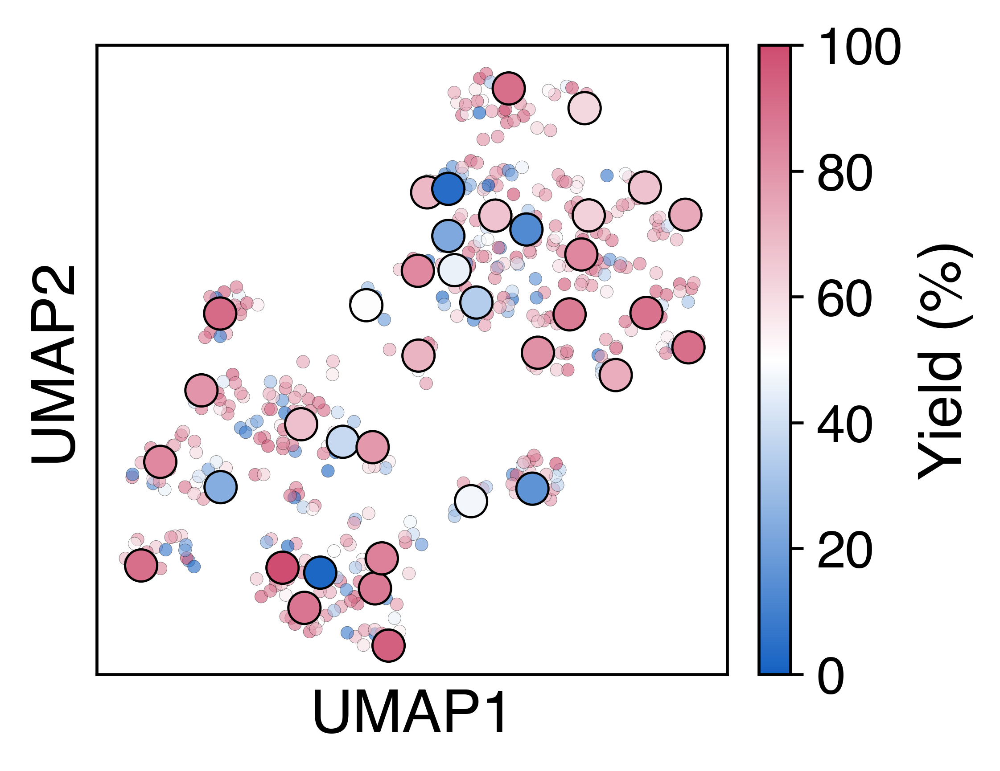

In [ ]:
print("UMAP for Doyle Clustering:\n")
# save and call the umap function
df_input.to_csv("df_dummy.csv", index=True, header=True)

Benchmark().track_samples(filename_umap=f"./../Amide_data/Datasets/umap_subs_high.csv",
                            filename_data=f"df_dummy.csv",
                            bounds=get_bounds("high"),
                            hide_axis = True, obj_plot_bounds=(1,0), cbar_scaling = 100,
                            filename_labelled=f"./../Amide_data/Datasets/amide_dset_dft_subs_high-yielding.csv",
                            name_results= ".", show_colorbar= True, 
                            label_round=False, display_cut_samples=False, figsize = (3.63, 2.77), size_scaling = 0.3, dpi=600)